## Preperation
### Import packages

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import matplotlib
import time
import seaborn as sns
import ast
import folium
import matplotlib.patches as patches

In [2]:
pd.set_option('display.float_format', '{:.2f}'.format)

In [3]:
# please change the path according to your own directory
input_path = '/Users/gracejia/Documents/A-UW/dissertation/Delivery Food Access_jun_24/delivery_food_access/'

### Merge the processed tract info with the geodataframe census tracts info 


In [4]:

# read csv files 
seattle_tracts = pd.read_csv(input_path + "data/Seattle_Tracts.csv")
pois = pd.read_csv(input_path + "data/Seattle_FB.csv") # Food inspection data obtained from the King County GIS data portal. Preprocessing done to remove extreneous establishments.
poi_traits = pd.read_csv(input_path + "data/processed_POIs_with_R.csv") # csv file where supply-demand ratio is added to each food establishment.
acc = pd.read_csv(input_path + "data/processed_tracts_with_Acc.csv") # csv file where each row is an accessibility metric and each column is a census tract.
acc_dist = pd.read_csv(input_path + "data/processed_tracts_with_Acc_and_distance.csv") # distance from one tract to establishments within its catchment area is added to this csv file.
fara = pd.read_csv(input_path + "data/FoodAccessResearchAtlasData2019.csv") # obtained from USDA
# read shape file data for plotting
tracts_2010 = gpd.read_file(input_path + "data/Census_Tracts_2010.shp")


In [19]:
acc # this should return 14 rows × 136 columns

,Unnamed: 0,Census Tract 25,Census Tract 26,Census Tract 56,Census Tract 68,Census Tract 60,Census Tract 59,Census Tract 57,Census Tract 49,Census Tract 58.01,...,Census Tract 72,Census Tract 71,Census Tract 58.02,Census Tract 70,Census Tract 69,Census Tract 260.01,Census Tract 5,Census Tract 109,Census Tract 112,Census Tract 119
0,Food Accessibility without Delivery restaurant,2.09,2.07,2.31,2.41,2.38,2.28,2.17,2.21,2.19,...,2.60,2.47,2.34,2.46,2.38,3.20,2.25,1.95,1.99,2.71
1,Food Accessibility with only Delivery restaurant,1.96,2.02,2.45,2.92,2.74,2.56,2.08,2.39,2.35,...,2.02,2.70,2.70,2.87,2.93,2.18,1.90,1.87,1.75,2.06
2,Food Accessibility without Delivery quick service,0.09,0.09,0.13,0.14,0.13,0.12,0.11,0.11,0.11,...,0.17,0.16,0.14,0.15,0.14,0.40,0.09,0.24,0.25,0.36
3,Food Accessibility with only Delivery quick se...,0.09,0.09,0.13,0.16,0.15,0.13,0.10,0.13,0.12,...,0.19,0.18,0.14,0.17,0.16,0.40,0.10,0.24,0.27,0.34
4,Food Accessibility without Delivery others,0.02,0.02,0.02,0.03,0.02,0.02,0.02,0.02,0.02,...,0.04,0.03,0.03,0.03,0.03,0.10,0.02,0.06,0.06,0.08
5,Food Accessibility with only Delivery others,0.02,0.02,0.02,0.03,0.03,0.03,0.02,0.03,0.02,...,0.04,0.04,0.03,0.03,0.03,0.10,0.02,0.05,0.06,0.08
6,Food Accessibility without Delivery grocery,0.38,0.38,0.47,0.44,0.43,0.43,0.47,0.41,0.44,...,0.47,0.46,0.45,0.46,0.45,0.92,0.44,0.53,0.57,0.84
7,Food Accessibility with only Delivery grocery,0.42,0.43,0.42,0.46,0.45,0.44,0.40,0.43,0.42,...,0.46,0.47,0.44,0.47,0.46,0.88,0.47,0.59,0.66,0.82
8,Diversity index without Delivery,0.60,0.60,0.66,0.65,0.63,0.64,0.66,0.62,0.64,...,0.67,0.67,0.66,0.66,0.66,0.87,0.61,0.85,0.87,0.89
9,Diversity index with only Delivery,0.65,0.65,0.62,0.61,0.62,0.62,0.64,0.64,0.62,...,0.76,0.66,0.61,0.63,0.60,0.99,0.69,0.88,0.94,0.97


In [5]:
# filter out non-Seattle information
# df with only WA King County tract information
king_fara = fara[(fara.State == "Washington") & (fara.County == "King County")]
# filter above df down to Seattle tracts only
seattle_tract_nos = tracts_2010.GEOID10.apply(int)
seattle_fara = king_fara[king_fara.CensusTract.isin(seattle_tract_nos)]
# create SNAP household participation rate for each tract
seattle_fara["hh_snap_rate"] = seattle_fara.TractSNAP/seattle_fara.OHU2010 * 100

/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_45306/3339007045.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  seattle_fara["hh_snap_rate"] = seattle_fara.TractSNAP/seattle_fara.OHU2010 * 100


In [6]:
# join Seattle FARA information to ACS census tracts
merged_info = seattle_fara[["CensusTract", "Pop2010", "hh_snap_rate","MedianFamilyIncome","LowIncomeTracts","LA1and10","LATractsVehicle_20"]]
tracts_2010["GEOID10"] = tracts_2010.GEOID10.apply(int)
tracts_2010_updated = tracts_2010.merge(merged_info, left_on = "GEOID10", right_on = "CensusTract", how="left")
# tracts_2010_updated can be used to plot polygons that represens the seattle census tracts

In [7]:
# need to rename the acc_dist columns, transpose it and merge with tracts_2010_updated
# first rename
for col in acc_dist.columns:
    new_col = col.split(' ')[-2:]
    new_col = ['Census'] + new_col
    new_col = ' '.join(new_col)
    acc_dist.rename(columns={col: new_col}, inplace=True)
# second resolve indexing issue and transpose
acc_dist.set_index('Census Unnamed: 0', inplace=True)
# transpose the DataFrame
acc_dist_transposed = acc_dist.T


In [8]:
# create a list of column names to exclude
exclude_cols = ['Available POI without Delivery ', 'Available POI with only Delivery ']
cols_to_convert = [col for col in acc_dist_transposed.columns if col not in exclude_cols]
# apply pd.to_numeric only to non-excluded columns
acc_dist_transposed[cols_to_convert] = acc_dist_transposed[cols_to_convert].apply(pd.to_numeric, errors='coerce')


In [9]:
acc_dist_transposed

Census Unnamed: 0,Food Accessibility without Delivery restaurant,Food Accessibility with only Delivery restaurant,Food Accessibility without Delivery quick service,Food Accessibility with only Delivery quick service,Food Accessibility without Delivery others,Food Accessibility with only Delivery others,Food Accessibility without Delivery grocery,Food Accessibility with only Delivery grocery,Diversity index without Delivery,Diversity index with only Delivery,Diversity index,Diversity FA without Delivery,Diversity FA with only Delivery,Diversity FA,Available POI without Delivery,Available POI with only Delivery
Census Tract 25,2.09,1.96,0.09,0.09,0.02,0.02,0.38,0.42,0.60,0.65,0.63,1.77,1.82,2.77,"[0, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 15, 16, 1...","[0, 2, 4, 5, 6, 7, 8, 10, 13, 15, 16, 19, 20, ..."
Census Tract 26,2.07,2.02,0.09,0.09,0.02,0.02,0.38,0.43,0.60,0.65,0.62,1.76,1.84,2.77,"[0, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 15, 16, 1...","[0, 2, 4, 5, 6, 7, 8, 10, 13, 15, 16, 19, 20, ..."
Census Tract 56,2.31,2.45,0.13,0.13,0.02,0.02,0.47,0.42,0.66,0.62,0.64,2.04,1.98,3.13,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15...","[1, 2, 3, 4, 5, 6, 7, 8, 12, 13, 14, 15, 16, 1..."
Census Tract 68,2.41,2.92,0.14,0.16,0.03,0.03,0.44,0.46,0.65,0.61,0.63,2.05,2.16,3.26,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15...","[0, 1, 3, 12, 14, 15, 20, 21, 22, 23, 25, 27, ..."
Census Tract 60,2.38,2.74,0.13,0.15,0.02,0.03,0.43,0.45,0.63,0.62,0.62,1.99,2.12,3.17,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15...","[0, 1, 3, 12, 14, 15, 21, 22, 23, 25, 27, 30, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Census Tract 260.01,3.20,2.18,0.40,0.40,0.10,0.10,0.92,0.88,0.87,0.99,0.93,3.79,3.52,7.00,"[9, 11, 17, 18, 24, 28, 47, 48, 49, 54, 62, 63...","[11, 17, 24, 28, 47, 49, 63, 75, 77, 80, 83, 8..."
Census Tract 5,2.25,1.90,0.09,0.10,0.02,0.02,0.44,0.47,0.61,0.69,0.65,1.88,1.87,2.95,"[0, 10, 13, 15, 16, 20, 26, 35, 37, 39, 40, 41...","[15, 16, 20, 26, 35, 37, 39, 40, 41, 44, 45, 5..."
Census Tract 109,1.95,1.87,0.24,0.24,0.06,0.05,0.53,0.59,0.85,0.88,0.87,2.38,2.44,4.39,"[1, 2, 3, 9, 12, 14, 17, 18, 21, 22, 23, 24, 2...","[1, 3, 9, 12, 14, 17, 18, 21, 23, 24, 25, 29, ..."
Census Tract 112,1.99,1.75,0.25,0.27,0.06,0.06,0.57,0.66,0.87,0.94,0.91,2.50,2.59,4.78,"[1, 3, 9, 12, 14, 17, 18, 21, 22, 23, 24, 25, ...","[1, 9, 12, 14, 17, 18, 24, 25, 28, 29, 30, 31,..."


In [10]:

acc_dist_transposed.reset_index(inplace=True)
acc_dist_transposed = acc_dist_transposed.rename_axis("", axis='index')
# now the "index" column can be used to merge with other dataframe

In [11]:
acc_dist_transposed

Census Unnamed: 0,index,Food Accessibility without Delivery restaurant,Food Accessibility with only Delivery restaurant,Food Accessibility without Delivery quick service,Food Accessibility with only Delivery quick service,Food Accessibility without Delivery others,Food Accessibility with only Delivery others,Food Accessibility without Delivery grocery,Food Accessibility with only Delivery grocery,Diversity index without Delivery,Diversity index with only Delivery,Diversity index,Diversity FA without Delivery,Diversity FA with only Delivery,Diversity FA,Available POI without Delivery,Available POI with only Delivery
,,,,,,,,,,,,,,,,,
0,Census Tract 25,2.09,1.96,0.09,0.09,0.02,0.02,0.38,0.42,0.60,0.65,0.63,1.77,1.82,2.77,"[0, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 15, 16, 1...","[0, 2, 4, 5, 6, 7, 8, 10, 13, 15, 16, 19, 20, ..."
1,Census Tract 26,2.07,2.02,0.09,0.09,0.02,0.02,0.38,0.43,0.60,0.65,0.62,1.76,1.84,2.77,"[0, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 15, 16, 1...","[0, 2, 4, 5, 6, 7, 8, 10, 13, 15, 16, 19, 20, ..."
2,Census Tract 56,2.31,2.45,0.13,0.13,0.02,0.02,0.47,0.42,0.66,0.62,0.64,2.04,1.98,3.13,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15...","[1, 2, 3, 4, 5, 6, 7, 8, 12, 13, 14, 15, 16, 1..."
3,Census Tract 68,2.41,2.92,0.14,0.16,0.03,0.03,0.44,0.46,0.65,0.61,0.63,2.05,2.16,3.26,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15...","[0, 1, 3, 12, 14, 15, 20, 21, 22, 23, 25, 27, ..."
4,Census Tract 60,2.38,2.74,0.13,0.15,0.02,0.03,0.43,0.45,0.63,0.62,0.62,1.99,2.12,3.17,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 12, 13, 14, 15...","[0, 1, 3, 12, 14, 15, 21, 22, 23, 25, 27, 30, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,Census Tract 260.01,3.20,2.18,0.40,0.40,0.10,0.10,0.92,0.88,0.87,0.99,0.93,3.79,3.52,7.00,"[9, 11, 17, 18, 24, 28, 47, 48, 49, 54, 62, 63...","[11, 17, 24, 28, 47, 49, 63, 75, 77, 80, 83, 8..."
131,Census Tract 5,2.25,1.90,0.09,0.10,0.02,0.02,0.44,0.47,0.61,0.69,0.65,1.88,1.87,2.95,"[0, 10, 13, 15, 16, 20, 26, 35, 37, 39, 40, 41...","[15, 16, 20, 26, 35, 37, 39, 40, 41, 44, 45, 5..."
132,Census Tract 109,1.95,1.87,0.24,0.24,0.06,0.05,0.53,0.59,0.85,0.88,0.87,2.38,2.44,4.39,"[1, 2, 3, 9, 12, 14, 17, 18, 21, 22, 23, 24, 2...","[1, 3, 9, 12, 14, 17, 18, 21, 23, 24, 25, 29, ..."


In [12]:
# columns that need to be added 
# A_i = sum A_ic 
acc_dist_transposed['O_i_only_delivery'] = acc_dist_transposed[['Food Accessibility with only Delivery restaurant',
                                                                'Food Accessibility with only Delivery others', 
                                                                'Food Accessibility with only Delivery quick service',
                                                                'Food Accessibility with only Delivery grocery']].sum(axis=1)

acc_dist_transposed['O_i_without_delivery'] = acc_dist_transposed[['Food Accessibility without Delivery restaurant',
                                                                    'Food Accessibility without Delivery others', 
                                        
                                                                   'Food Accessibility without Delivery quick service',
                                                                    'Food Accessibility without Delivery grocery']].sum(axis=1)
acc_dist_transposed['A_i_only_delivery'] = acc_dist_transposed['O_i_only_delivery'] ** acc_dist_transposed['Diversity index with only Delivery']
acc_dist_transposed['A_i_without_delivery'] = acc_dist_transposed['O_i_without_delivery'] ** acc_dist_transposed['Diversity index without Delivery']


In [13]:
# try to merge acc_dist_transposed and tracts_2010_updated
merged_tracts = tracts_2010_updated.merge(acc_dist_transposed, 
                                          left_on ="NAMELSAD10", 
                                          right_on='index', 
                                          how='left')


## Study area overview (Section 4)
- business statistics
    - http://www5.kingcounty.gov/sdc/Metadata.aspx?Layer=food_facilities
- census tract population description
    - Seattle population demographics: https://www.seattle.gov/opcd/population-and-demographics/about-seattle; https://www.census.gov/quickfacts/seattlecitywashington; 
    - SNAP eligibility: https://www.benefits.gov/benefit/1364
    - https://www.mdpi.com/1660-4601/17/14/5190
    - https://nutr.uw.edu/wp-content/uploads/2020/11/WAFOOD_intro_brief_20201117.pdf (with reference towards the end)
    - https://www.seattletimes.com/seattle-news/health/food-insecurity-persists-in-wa-as-emergency-snap-benefits-run-out-this-week/
    - https://www.ers.usda.gov/data-products/food-access-research-atlas/documentation/
    - https://gisportal.ers.usda.gov/portal/apps/experiencebuilder/experience/?id=a53ebd7396cd4ac3a3ed09137676fd40
        - "Although many military commissaries and warehouse club stores offer a wide variety of foods and accept SNAP benefits, military commissaries are only accessible to a select group of individuals and club stores are only available to those who pay an annual membership fee."
    - https://gisportal.ers.usda.gov/portal/apps/experiencebuilder/experience/?id=a53ebd7396cd4ac3a3ed09137676fd40

### Study area statistics

In [14]:
# 2014-2018 5-year American Community Survey (ACS) estimates on demographic characteristics in Seattle
# says Average household size: 2.12 (+/- 0.01)
SNAP_popu = (seattle_fara['OHU2010'] * seattle_fara['hh_snap_rate'] / 100).sum() 
print("there are total {:.2f} Seattle housing units participating in SNAP.".format(SNAP_popu))
print("there are total {:.2f} Seattle residents participating in SNAP.".format(SNAP_popu * 2.12))

there are total 28552.00 Seattle housing units participating in SNAP.
there are total 60530.24 Seattle residents participating in SNAP.


In [15]:
merged_tracts['Pop2010'].sum()

622984

In [16]:
snap_eligibility = (29160 + 39440/2 + 49720/3 + 60000/4 + 70280 / 5 + 80560 / 6 + 90840 / 7 + 101120/8)/8
print('the average annual household income limit before taxes for SNAP eligibility in seattle is {:0.2f}'.format(snap_eligibility))

the average annual household income limit before taxes for SNAP eligibility in seattle is 16694.14


In [17]:
# printing out some statistics for the snap participation rate
print("the average SNAP participation rate in Seattle is {:.2f}%".format(seattle_fara.hh_snap_rate.mean()))
print("the median SNAP participation rate in Seattle is {:.2f}%".format(seattle_fara.hh_snap_rate.median()))
print("the maximum SNAP participation rate in Seattle is {:.2f}%".format(seattle_fara.hh_snap_rate.max()))



the average SNAP participation rate in Seattle is 10.46%
the median SNAP participation rate in Seattle is 6.80%
the maximum SNAP participation rate in Seattle is 49.36%


power law distribution relating to wealth distribution:

    * https://www.sciencedirect.com/science/article/pii/S0378437114002544
    * https://www.google.com/search?q=power+law+distribution+for+wealth+&rlz=1C5CHFA_enUS912US912&sxsrf=APwXEdd_pd5yG2JhohhlOJ7fh0jfvrd5-A%3A1682278974724&ei=PopFZOPtK_DZkPIPwYCX2Ao&ved=0ahUKEwjjhM7F4cD-AhXwLEQIHUHABasQ4dUDCBA&uact=5&oq=power+law+distribution+for+wealth+&gs_lcp=Cgxnd3Mtd2l6LXNlcnAQAzIFCCEQoAEyBQghEKABMgUIIRCgATIFCCEQoAEyBQghEKABMgUIIRCrAjoKCAAQRxDWBBCwAzoWCC4QigUQ1AIQsAMQQxCLAxCoAxCaAzoNCAAQigUQsAMQQxCLAzoFCAAQgAQ6BwgAEIoFEEM6BggAEBYQHjoICAAQFhAeEA86CAgAEIoFEIYDOggIIRAWEB4QHToKCCEQFhAeEA8QHUoECEEYAFCvBViNHWCLI2gBcAF4AIABnAGIAcELkgEEMC4xMpgBAKABAcgBCrgBAsABAQ&sclient=gws-wiz-serp

In [18]:
# if the SNAP participation rate is greater than 16%, it is considered a high rate because only 20% of 
# the tracts have a rate greater than 16%. And there are 27 tracts that have a rate greater than 16%.


high_rate = seattle_fara[seattle_fara['hh_snap_rate'] >= 16]
print('percentage of tracts with high SNAP participation rate: {:.2f}%'.format(len(high_rate)/len(seattle_fara) * 100))
print('number of tracts with high SNAP participation rate: {}'.format(len(high_rate)))

percentage of tracts with high SNAP participation rate: 20.00%
number of tracts with high SNAP participation rate: 27


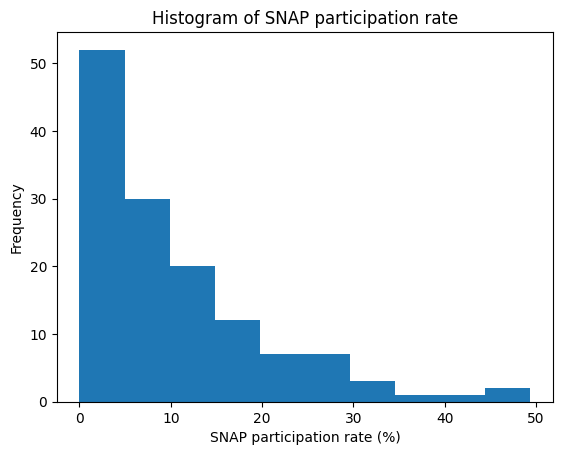

In [19]:
# plot histogram to see the right-tail distribution of SNAP participation rate
plt.hist(seattle_fara['hh_snap_rate'], bins=10)  # set number of bins as desired
plt.xlabel('SNAP participation rate (%)')  # set x-axis label as desired
plt.ylabel('Frequency')  # set y-axis label as desired
plt.title('Histogram of SNAP participation rate')  # set title as desired
# plt.savefig(input_path  + '/upscaled_rj/figures_remade/histogram_snap_participation_rate.png')
plt.show()

### Plot the POI spatial distribution
* need to add the north arrow and scale bar

In [20]:
# prep the POI data
crs = 'EPSG:4326'
geom = [Point(xy) for xy in zip(pois.lon, pois.lat)]
geom_df = gpd.GeoDataFrame(pois, 
                          crs = crs, 
                          geometry = geom)

# separate POIs by restaurant type
restaurants = geom_df[geom_df.main_type == "restaurant"]
quick_service = geom_df[geom_df.main_type == "quick service"]
grocery = geom_df[geom_df.main_type == "grocery"]
other = geom_df[geom_df.main_type == "others"]

In [21]:
sum(len(i) for i in [restaurants, quick_service, grocery, other])
# this should return 4729 pois in total

4729

In [22]:
for i in [restaurants, quick_service, grocery, other]:
    print(len(i) / 4729 * 100)

# notice that the other category only account for 2.6% of the total Pois, this paper decide 
# to exclude this category from the plots

77.26792133643477
8.225840558257559
11.92641150348911
2.5798266018185663


some establishment for this "other" category are Kay catering, Amazing Lunches, which either do not sell food to the general public or do not sell standard portion of food.

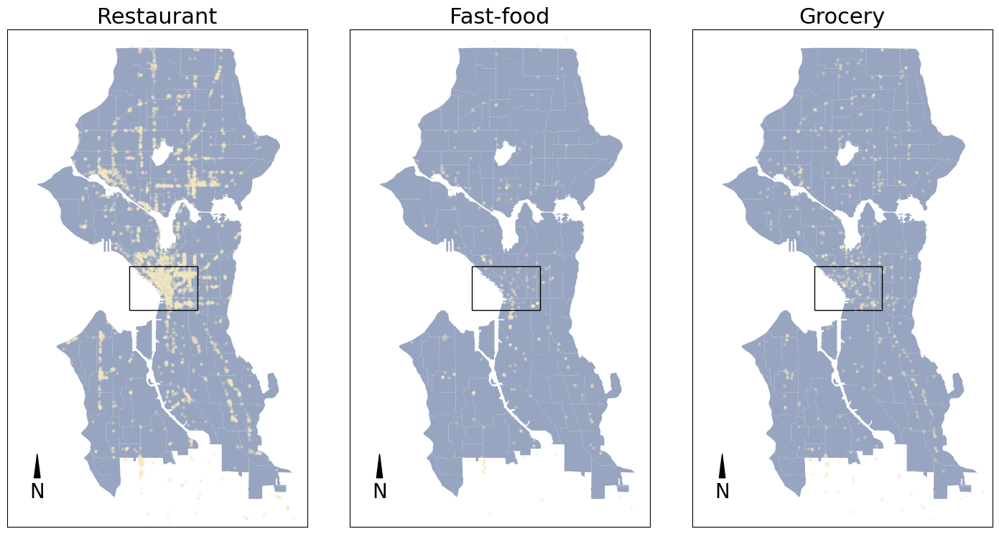

In [23]:
# Define the coordinates of the bounding box
x_min, x_max = -122.363604, -122.310561
y_min, y_max = 47.595458, 47.618721

fig, axs = plt.subplots(1, 3, figsize=(20,9))

poi_types_dfs = [restaurants, quick_service, grocery]
sub_titles = ["Restaurant", "Fast-food", "Grocery"]
count = 0
fig.subplots_adjust(wspace=-0.2) # adjust the spacing

for j in range(len(poi_types_dfs)):
    # plot base map
    tracts_2010_updated.to_crs(epsg=4326).plot(ax = axs[j], color = '#97A5C0')
    # plot poi locations by type
    poi_types_dfs[count].plot(ax=axs[j], alpha=0.3, markersize = 5, color = '#F4E8C0')

    # remove the x and y ticks, set titles for subplots
    axs[j].set_xticks([], [])
    axs[j].set_yticks([], [])
    axs[j].set_xlim(-122.459444, -122.224167) # Set the x-axis limits
    axs[j].set_ylim(47.480833, 47.743889) # Set the y-axis limits
    axs[j].set_title(sub_titles[count], fontsize=22)
    count += 1

# Create a Rectangle patch
    # x_min, x_max = -122.363604, -122.310561
    # y_min, y_max = 47.595458, 47.618721
    rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='black', facecolor='none')

# Add the patch to the axes
    axs[j].add_patch(rect)
    # add north arrow
    axs[j].annotate('N', xy=(0.1, 0.15), xytext=(0.1, 0.05), ha='center', va='bottom',
                    xycoords='axes fraction', textcoords='axes fraction', fontsize=20,
                    arrowprops=dict(facecolor='black', arrowstyle='wedge'))

plt.savefig(input_path + 'figures/outlet_distribution.png', bbox_inches='tight')
plt.show()

## Analyzing results

### How the benefit (increase in food accessibility) brought by delivery services varies across different population segments and subregions

####  Incorporating delivery changes $R_j$ for each POI?
* prep the food outlet dataframe

In [24]:
# poi_traits = pd.read_csv(input_path + "upscaled_rj/processed_POIs_with_R.csv")
poi_traits = poi_traits.T
# set the first row as column names
poi_traits.columns = poi_traits.iloc[0]
poi_traits = poi_traits[1:]
poi_traits.reset_index(inplace=True)


In [25]:
# merge poi_traits and pois
poi_r = pd.concat([poi_traits, pois.rename_axis('index')], axis=1, join='inner')

census tract information is: tracts_2010_updated.to_crs(epsg=4326).plot(ax = axs[j])

In [26]:
df = poi_r
df['R with only delivery'] = np.where(df['R with only delivery'] < df['capacity'], df['capacity'], df['R with only delivery'])
df['R without delivery'] = np.where(df['R without delivery']<df['capacity'], df['capacity'], df['R without delivery'])

crs = 'EPSG:4326'
geom = [Point(xy) for xy in zip(df.lon, df.lat)]
geom_df = gpd.GeoDataFrame(df, 
                          crs = crs, 
                          geometry = geom)

# separate POIs by restaurant type
restaurants = df[df.main_type == "restaurant"]
quick_service = df[df.main_type == "quick service"]
grocery = df[df.main_type == "grocery"]
other = df[df.main_type == "others"]

In [27]:

# convert columns to numeric
restaurants['R with only delivery'] = pd.to_numeric(restaurants['R with only delivery'])
restaurants['R without delivery'] = pd.to_numeric(restaurants['R without delivery'])
quick_service['R with only delivery'] = pd.to_numeric(quick_service['R with only delivery'])
quick_service['R without delivery'] = pd.to_numeric(quick_service['R without delivery'])
grocery['R with only delivery'] = pd.to_numeric(grocery['R with only delivery'])
grocery['R without delivery'] = pd.to_numeric(grocery['R without delivery'])
other['R with only delivery'] = pd.to_numeric(other['R with only delivery'])
other['R without delivery'] = pd.to_numeric(other['R without delivery'])

/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_45306/3534627202.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  restaurants['R with only delivery'] = pd.to_numeric(restaurants['R with only delivery'])
/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_45306/3534627202.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  restaurants['R without delivery'] = pd.to_numeric(restaurants['R without delivery'])
/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_45306/3534627202.py:4: 

In [29]:
# Create the lists of data
restaurants_with_delivery = pd.to_numeric(restaurants['R with only delivery'])
restaurants_without_delivery = pd.to_numeric(restaurants['R without delivery'])

quick_service_with_delivery = pd.to_numeric(quick_service['R with only delivery'])
quick_service_without_delivery = pd.to_numeric(quick_service['R without delivery'])

grocery_with_delivery = pd.to_numeric(grocery['R with only delivery'])
grocery_without_delivery = pd.to_numeric(grocery['R without delivery'])

other_with_delivery = pd.to_numeric(other['R with only delivery'])
other_without_delivery = pd.to_numeric(other['R without delivery'])

# Create the summary statistic tables
summary_table_with_delivery = pd.DataFrame({
    'Mean': [restaurants_with_delivery.mean(), quick_service_with_delivery.mean(), grocery_with_delivery.mean(), other_with_delivery.mean()],
    'Median': [restaurants_with_delivery.median(), quick_service_with_delivery.median(), grocery_with_delivery.median(), other_with_delivery.median()],
    'Standard Deviation': [restaurants_with_delivery.std(), quick_service_with_delivery.std(), grocery_with_delivery.std(), other_with_delivery.std()]
}, index=['Restaurant', 'Fast-food', 'Grocery', 'Others'])

summary_table_without_delivery = pd.DataFrame({
    'Mean': [restaurants_without_delivery.mean(), quick_service_without_delivery.mean(), grocery_without_delivery.mean(), other_without_delivery.mean()],
    'Median': [restaurants_without_delivery.median(), quick_service_without_delivery.median(), grocery_without_delivery.median(), other_without_delivery.median()],
    'Standard Deviation': [restaurants_without_delivery.std(), quick_service_without_delivery.std(), grocery_without_delivery.std(), other_without_delivery.std()]
}, index=['Restaurant', 'Fast-food', 'Grocery', 'Others'])

# Format the tables
summary_table_with_delivery.columns = pd.MultiIndex.from_product([['On-premise supply-demand ratio'], summary_table_with_delivery.columns])
summary_table_without_delivery.columns = pd.MultiIndex.from_product([['Delivery supply-demand ratio'], summary_table_without_delivery.columns])

summary_table = pd.concat([summary_table_with_delivery, summary_table_without_delivery], axis=1)

# Print the summary statistic table
print(summary_table)

           On-premise supply-demand ratio                            \
                                     Mean Median Standard Deviation   
Restaurant                         153.14  27.00            1586.21   
Fast-food                          159.69  15.61             888.14   
Grocery                            115.23  38.68             906.48   
Others                              10.78  10.78               0.00   

           Delivery supply-demand ratio                            
                                   Mean Median Standard Deviation  
Restaurant                        69.29  27.00             540.54  
Fast-food                        159.69  15.61             888.14  
Grocery                          191.77  38.68            1277.37  
Others                            10.78  10.78               0.00  


In [30]:
# check if all pois have ratio greater than 1
for i in [restaurants_with_delivery, quick_service_with_delivery, grocery_with_delivery, other_with_delivery]:
    print(len(i[i < 1]))

0
0
0
0


In [31]:
capacity_list = pd.DataFrame(pois[pois['main_type'] == 'restaurant']["SEAT_CAP"].value_counts())

In [32]:
capacity_list

,count
SEAT_CAP,
Seating 13-50,1437
Seating 0-12,1099
Seating 51-150,904
Seating 151-250,133
Seating > 250,81


In [33]:
1099/4607

0.2385500325591491

In [34]:
1437/4607

0.31191664857825047


#### $𝐴_{𝑖𝑐}$ and population segment?
Note: now we are working with merged_tracts dataframe. To save the original data, create another dataframe df_a

In [35]:
types = ["restaurant","grocery","quick service", "others"]
df_a = merged_tracts
df_b = pois
df_b.rename({'Unnamed: 0':'poi_id'}, inplace = True)

In [36]:
# this count function is not used
# define a function to count the types for each row in df_a
def count_types(df_a, df_b, col_name="Available POI without Delivery "):
    types = ["restaurant", "grocery", "quick service", "others"]
    row_count = {}
    for i in range(len(df_a)):
        count = [0, 0, 0, 0]
        my_list = ast.literal_eval(df_a[col_name][i])
        for j in my_list:
            for k in range(len(types)):
                if df_b["main_type"][j] == types[k]:
                    count[k] += 1
        if col_name == "Available POI without Delivery ":
            case = "Dine_in "
        else:
            case = "Delivery "
        row_count[i] = {case + types[0]: count[0],
                        case + types[1]: count[1],
                        case + types[2]: count[2],
                        case + types[3]: count[3]}
    return row_count

In [37]:
counts = count_types(df_a, df_b)
df_counts = pd.DataFrame.from_dict(counts, orient='index')
df_a = pd.concat([df_a, df_counts], axis=1)
counts = count_types(df_a, df_b, col_name = 'Available POI with only Delivery ')
df_counts = pd.DataFrame.from_dict(counts, orient='index')
df_a = pd.concat([df_a, df_counts], axis=1)

In [38]:
grocery_temp = geom_df[geom_df.main_type == "grocery"]

In [39]:
len(grocery_temp)

564

In [50]:
# Accessibility interactive maps - not included in the paper but might be fun to look at

# Create a Folium map object centered around the data
m = folium.Map(location=[df_a['geometry'].centroid.y.mean(), df_a['geometry'].centroid.x.mean()], zoom_start=10)

# Create a GeoJsonTooltip object to display the census tract population on hover
tooltip = folium.features.GeoJsonTooltip(fields=['Pop2010'], aliases=['Population'], localize=True, sticky=True)
tooltip2 = folium.features.GeoJsonTooltip(fields = ['NAME'], aliases = ['Grocery Name'], localize = True, sticky = True)
# Add the GeoPandas DataFrame to the map as a GeoJSON layer with the tooltip
folium.GeoJson(df_a, tooltip=tooltip).add_to(m)
folium.GeoJson(grocery_temp, tooltip = tooltip2).add_to(m)
# Display the map
m


/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_15250/3841839453.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[df_a['geometry'].centroid.y.mean(), df_a['geometry'].centroid.x.mean()], zoom_start=10)
/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_15250/3841839453.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[df_a['geometry'].centroid.y.mean(), df_a['geometry'].centroid.x.mean()], zoom_start=10)


/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_45306/391024089.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('binary')


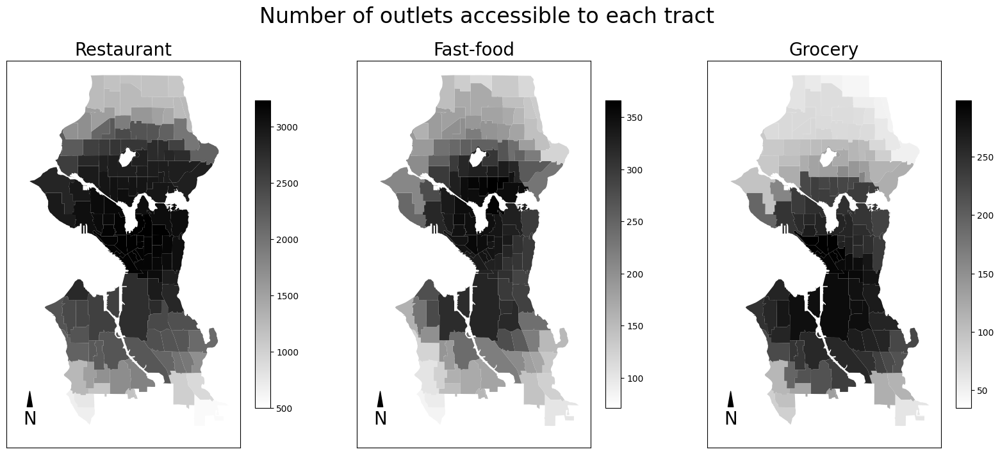

In [40]:
columns_to_plot = ["Dine_in restaurant","Dine_in grocery","Dine_in quick service", "Dine_in others"]

poi_types_dfs = [restaurants, quick_service, grocery]
sub_titles = ["Restaurant", "Fast-food", "Grocery"]
count = 0

cmap = plt.cm.get_cmap('binary')

fig, axs = plt.subplots(1, 3, figsize=(20,8))

for j in range(3):
    df_a.to_crs(epsg=4326).plot(column=columns_to_plot[count], ax=axs[j], cmap=cmap, legend=True, legend_kwds={'shrink': 0.78})

    axs[j].set_xticks([])
    axs[j].set_yticks([])
    axs[j].set_xlim(-122.459444, -122.224167) 
    axs[j].set_ylim(47.480833, 47.743889) 
    axs[j].set_title(sub_titles[count], fontsize=20)
    count += 1
    
    axs[j].annotate('N', xy=(0.1, 0.15), xytext=(0.1, 0.05), ha='center', va='bottom',
                    xycoords='axes fraction', textcoords='axes fraction', fontsize=20,
                    arrowprops=dict(facecolor='black', arrowstyle='wedge'))

# fig.tight_layout(pad=3.0)
plt.suptitle('Number of outlets accessible to each tract', fontsize=24)
plt.savefig(input_path + 'figures/number_of_outlets.png', bbox_inches='tight')
plt.show()

Summary Statistics

In [41]:
group_delivery = [df_a['Food Accessibility with only Delivery restaurant'],
                  df_a['Food Accessibility with only Delivery quick service'],
                  df_a['Food Accessibility with only Delivery grocery']]
                  #df_a['Food Accessibility with only Delivery others']]
group_dine_in = [df_a['Food Accessibility without Delivery restaurant'],
                 df_a['Food Accessibility without Delivery quick service'],
                 df_a['Food Accessibility without Delivery grocery']]
                #df_a['Food Accessibility without Delivery others']]
# 1 means delivery
# 2 means dine-in
group1_stats = pd.DataFrame({
    'mean': [np.mean(x) for x in group_delivery],
    'median': [np.median(x) for x in group_delivery],
    'standard deviation': [np.std(x) for x in group_delivery]
}, index=sub_titles)

group2_stats = pd.DataFrame({
    'mean': [np.mean(x) for x in group_dine_in],
    'median': [np.median(x) for x in group_dine_in],
    'standard deviation': [np.std(x) for x in group_dine_in]
}, index=sub_titles)


# concatenate the two DataFrames
stats = pd.concat([group1_stats, group2_stats], axis=1, keys=['Delivery $A_{ic}$', 'On-premise $A_{ic}$'])

# display the statistics DataFrame
print(stats)

           Delivery $A_{ic}$                           On-premise $A_{ic}$  \
                        mean median standard deviation                mean   
Restaurant              2.23   2.11               0.39                2.24   
Fast-food               0.16   0.16               0.06                0.16   
Grocery                 0.48   0.45               0.09                0.48   

                                      
           median standard deviation  
Restaurant   2.21               0.24  
Fast-food    0.15               0.07  
Grocery      0.47               0.09  


$A_{ic}$ Heatmaps

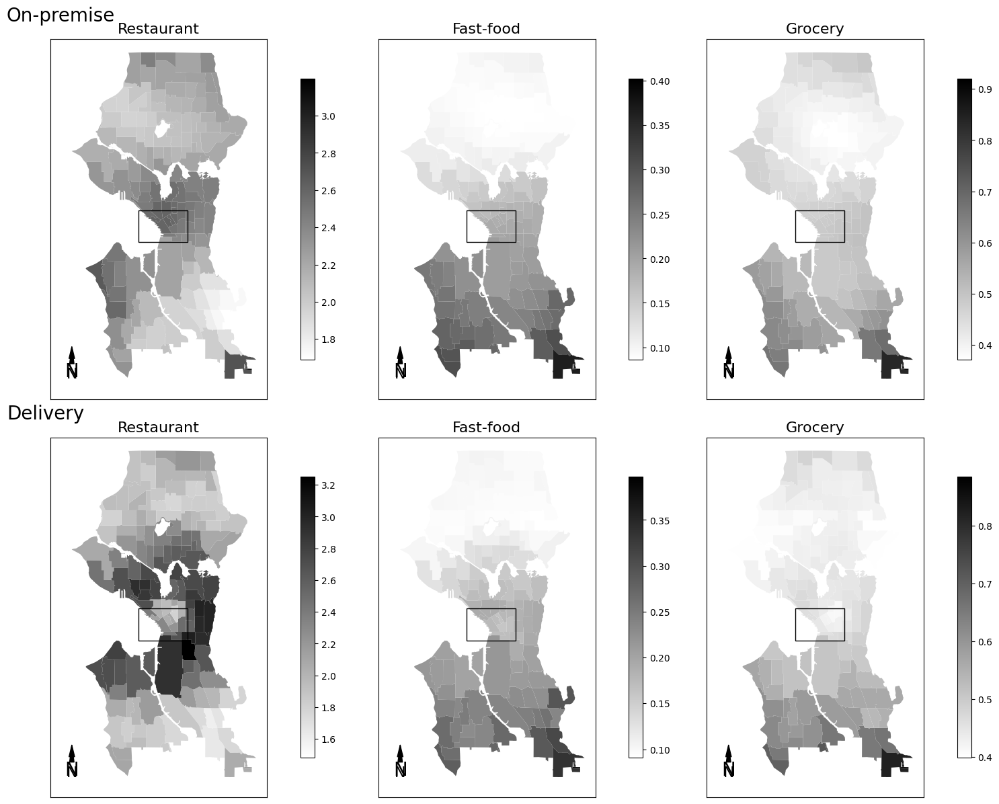

In [42]:

columns_to_plot_dine_in = ["Food Accessibility without Delivery restaurant",
                           "Food Accessibility without Delivery quick service",
                           "Food Accessibility without Delivery grocery",
                           "Food Accessibility without Delivery others"]

columns_to_plot_delivery = ["Food Accessibility with only Delivery restaurant",
                            "Food Accessibility with only Delivery quick service",
                            "Food Accessibility with only Delivery grocery",
                            "Food Accessibility with only Delivery others"]

poi_types_dfs = [restaurants, quick_service, grocery, other]
sub_titles = ["Restaurant", "Fast-food", "Grocery", "Others"]
cmap = matplotlib.colormaps['binary']
row_annotation = ['On-premise', 'Delivery']
# cmap = plt.cm.get_cmap('binary')

fig, axs = plt.subplots(2, 3, figsize=(20, 12))
plt.subplots_adjust(wspace=-0.6, hspace=0.3)
# Adjust spacing


for i in range(2):  # Loop for the rows
    count = 0
    for j in range(3):  # Loop for the columns, excluding the last column for the other category
        if i == 0:
            columns_to_plot = columns_to_plot_dine_in
        else:
            columns_to_plot = columns_to_plot_delivery

        df_a.to_crs(epsg=4326).plot(column=columns_to_plot[count], ax=axs[i, j], cmap=cmap, legend=True, legend_kwds={'shrink': 0.78})

        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])
        axs[i, j].set_xlim(-122.459444, -122.224167)
        axs[i, j].set_ylim(47.480833, 47.743889)
        axs[i, j].set_title(sub_titles[count], fontsize=16)
        count += 1

        axs[i, j].annotate('N', xy=(0.1, 0.15), xytext=(0.1, 0.05), ha='center', va='bottom',
                           xycoords='axes fraction', textcoords='axes fraction', fontsize=16,
                           arrowprops=dict(facecolor='black', arrowstyle='wedge'))
        # Create a Rectangle patch
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='black', facecolor='none')

# Add the patch to the axes
        axs[i, j].add_patch(rect)
    # add north arrow
        axs[i, j].annotate('N', xy=(0.1, 0.15), xytext=(0.1, 0.05), ha='center', va='bottom',
                    xycoords='axes fraction', textcoords='axes fraction', fontsize=20,
                    arrowprops=dict(facecolor='black', arrowstyle='wedge'))

# Add row annotations
axs[0, 0].annotate(row_annotation[0], xy=(-0.2, 1.05), xycoords='axes fraction', fontsize=20)
axs[1, 0].annotate(row_annotation[1], xy=(-0.2, 1.05), xycoords='axes fraction', fontsize=20)
fig.tight_layout()
plt.savefig(input_path + 'figures/A_ic_heatmap.png', bbox_inches='tight')
plt.show()

In [64]:
# Accessibility interactive maps - not included in the manuscript

# Create a Folium map object centered around the data
m = folium.Map(location=[df_a['geometry'].centroid.y.mean(), df_a['geometry'].centroid.x.mean()], zoom_start=10)

# Create a GeoJsonTooltip object to display the census tract population on hover
tooltip = folium.features.GeoJsonTooltip(fields=['Pop2010', 'Food Accessibility without Delivery grocery','Food Accessibility with only Delivery grocery'], aliases=['Population','Grocery On-premise','Grocery Delivery'], localize=True, sticky=True)
# tooltip2 = folium.features.GeoJsonTooltip(fields = ['NAME'], aliases = ['Grocery Name'], localize = True, sticky = True)
# Add the GeoPandas DataFrame to the map as a GeoJSON layer with the tooltip
folium.GeoJson(df_a, tooltip=tooltip).add_to(m)
# folium.GeoJson(grocery_temp, tooltip = tooltip2).add_to(m)
# Display the map
m


/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_15250/1835293573.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[df_a['geometry'].centroid.y.mean(), df_a['geometry'].centroid.x.mean()], zoom_start=10)
/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_15250/1835293573.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[df_a['geometry'].centroid.y.mean(), df_a['geometry'].centroid.x.mean()], zoom_start=10)


In [43]:
# Assume the binary columns are in a dataframe called `df_a`, columns of interest are
# ["LowIncomeTracts", "LA1and10", "LATractsVehicle_20"]
# Find the row index where "LowIncomeTracts" == 1
low_income_row = df_a.index[df_a["LowIncomeTracts"] == 1].tolist()
low_income_tracts = df_a.iloc[low_income_row]['NAMELSAD10'].tolist()
# Find the row index where "Low access tracts (urban/rural based)" == 1
low_access_urban_rural_row = df_a.index[df_a["LA1and10"] == 1].tolist()
low_access_urban_rural_tracts= df_a.iloc[low_access_urban_rural_row]['NAMELSAD10'].tolist()
# Find the row index where "Low access tracts (USDA based)" == 1
low_access_usda_row = df_a.index[df_a["LATractsVehicle_20"] == 1].tolist()
low_access_usda_tracts= df_a.iloc[low_access_usda_row]['NAMELSAD10'].tolist()
# Find the row index where the hh_snap_rate > 16 (about 20% of tracts have rate larger than 16%)
high_participation_row = df_a.index[df_a["hh_snap_rate"] > 16].tolist()
high_participation_tracts = df_a.iloc[high_participation_row]['NAMELSAD10'].tolist()

Delivery: low income tract grocery specific food accessibility min = 0.413, mean = 0.513, max = 0.719
Delivery: non low income tract grocery specific food accessibility min = 0.399, mean = 0.473, max = 0.885
Delivery: low access tract grocery specific food accessibility min = 0.400, mean = 0.525, max = 0.664
Delivery: non low access tract grocery specific food accessibility min = 0.399, mean = 0.475, max = 0.885


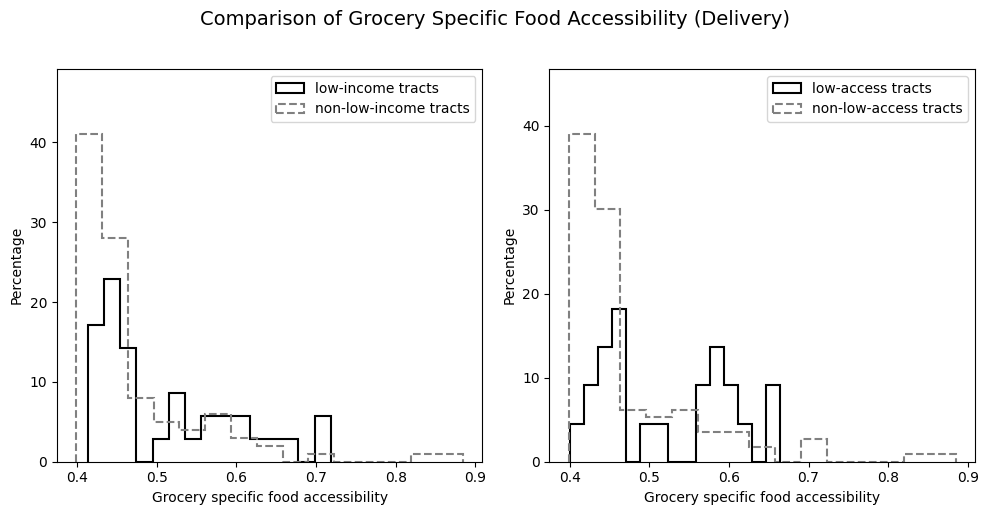

In [44]:
# Define the number of bins for the histogram
bins = 15
fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # create a figure with two subplots

# Function to convert counts to percentages
def plot_hist_with_percentages(ax, data, bins, **kwargs):
    counts, bins, patches = ax.hist(data, bins=bins, weights=np.ones(len(data)) / len(data) * 100, **kwargs)
    ax.set_ylim(0, max(counts) * 1.2)
    return counts, bins, patches

# Plot the first histogram in the left subplot
data1 = df_a.loc[low_income_row, 'Food Accessibility with only Delivery grocery']
data2 = df_a.loc[~df_a.index.isin(low_income_row), 'Food Accessibility with only Delivery grocery']
print('Delivery: low income tract grocery specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data1.min(), data1.mean(), data1.max()))
print('Delivery: non low income tract grocery specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data2.min(), data2.mean(), data2.max()))

plot_hist_with_percentages(axs[0], data1, bins, edgecolor='black', label='low-income tracts', histtype='step', linewidth=1.5)
plot_hist_with_percentages(axs[0], data2, bins, edgecolor='gray', linestyle='--', label='non-low-income tracts', histtype='step', linewidth=1.5)

axs[0].set_xlabel('Grocery specific food accessibility')
axs[0].set_ylabel('Percentage')
axs[0].legend(loc='upper right')

# Plot the second histogram in the right subplot
data1 = df_a.loc[low_access_usda_row, 'Food Accessibility with only Delivery grocery']
data2 = df_a.loc[~df_a.index.isin(low_access_usda_row), 'Food Accessibility with only Delivery grocery']
print('Delivery: low access tract grocery specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data1.min(), data1.mean(), data1.max()))
print('Delivery: non low access tract grocery specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data2.min(), data2.mean(), data2.max()))

plot_hist_with_percentages(axs[1], data1, bins, edgecolor='black', label='low-access tracts', histtype='step', linewidth=1.5)
plot_hist_with_percentages(axs[1], data2, bins, edgecolor='gray', linestyle='--', label='non-low-access tracts', histtype='step', linewidth=1.5)

axs[1].set_xlabel('Grocery specific food accessibility')
axs[1].set_ylabel('Percentage')
axs[1].legend(loc='upper right')

# Add a super title and remove subtitles
plt.suptitle('Comparison of Grocery Specific Food Accessibility (Delivery)', fontsize=14, y=1.02)
axs[0].set_title('')
axs[1].set_title('')
# Add a super title and remove subtitles
plt.suptitle('Comparison of Grocery Specific Food Accessibility (Delivery)', fontsize=14, y=1.02)
axs[0].set_title('')
axs[1].set_title('')

plt.tight_layout()  # adjust subplot spacing
plt.savefig(input_path + 'figures/A_i_grocery_delivery_comparison.png', bbox_inches='tight')
plt.show()

Delivery: low income tract restaurant specific food accessibility min = 1.595, mean = 2.213, max = 3.250
Delivery: non low income tract restaurant specific food accessibility min = 1.482, mean = 2.232, max = 3.014
Delivery: low access tract restaurant specific food accessibility min = 1.731, mean = 2.198, max = 3.033
Delivery: non low access tract restaurant specific food accessibility min = 1.482, mean = 2.233, max = 3.250


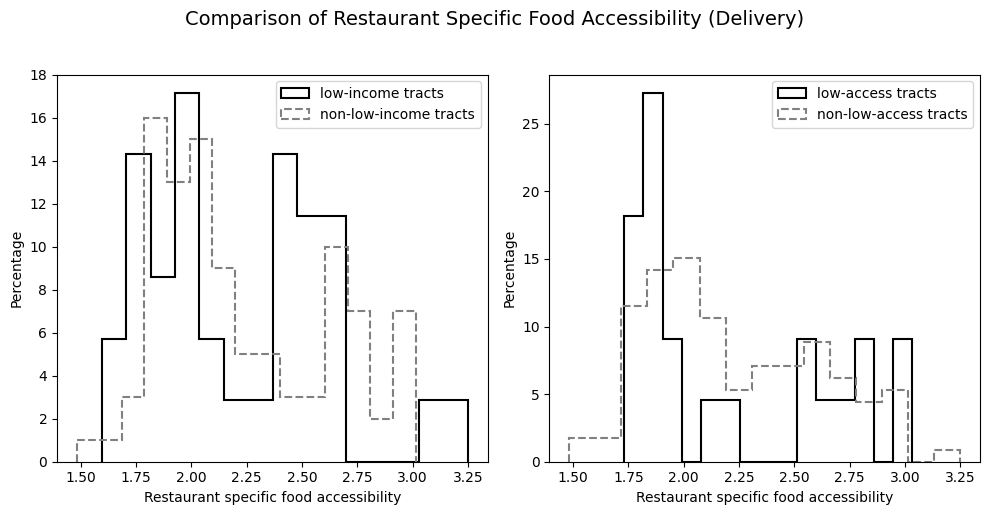

In [45]:
# Define the number of bins for the histogram
bins = 15
fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # create a figure with two subplots

# Function to convert counts to percentages
def plot_hist_with_percentages(ax, data, bins, **kwargs):
    counts, bins, patches = ax.hist(data, bins=bins, weights=np.ones(len(data)) / len(data) * 100, **kwargs)
    return counts, bins, patches

# Plot the first histogram in the left subplot
data1 = df_a.loc[low_income_row, 'Food Accessibility with only Delivery restaurant']
data2 = df_a.loc[~df_a.index.isin(low_income_row), 'Food Accessibility with only Delivery restaurant']
print('Delivery: low income tract restaurant specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data1.min(), data1.mean(), data1.max()))
print('Delivery: non low income tract restaurant specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data2.min(), data2.mean(), data2.max()))

plot_hist_with_percentages(axs[0], data1, bins, edgecolor='black', label='low-income tracts', histtype='step', linewidth=1.5)
plot_hist_with_percentages(axs[0], data2, bins, edgecolor='gray', linestyle='--', label='non-low-income tracts', histtype='step', linewidth=1.5)

axs[0].set_xlabel('Restaurant specific food accessibility')
axs[0].set_ylabel('Percentage')
axs[0].legend(loc='upper right')

# Plot the second histogram in the right subplot
data1 = df_a.loc[low_access_usda_row, 'Food Accessibility with only Delivery restaurant']
data2 = df_a.loc[~df_a.index.isin(low_access_usda_row), 'Food Accessibility with only Delivery restaurant']
print('Delivery: low access tract restaurant specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data1.min(), data1.mean(), data1.max()))
print('Delivery: non low access tract restaurant specific food accessibility min = {:.3f}, mean = {:.3f}, max = {:.3f}'.format(data2.min(), data2.mean(), data2.max()))

plot_hist_with_percentages(axs[1], data1, bins, edgecolor='black', label='low-access tracts', histtype='step', linewidth=1.5)
plot_hist_with_percentages(axs[1], data2, bins, edgecolor='gray', linestyle='--', label='non-low-access tracts', histtype='step', linewidth=1.5)

axs[1].set_xlabel('Restaurant specific food accessibility')
axs[1].set_ylabel('Percentage')
axs[1].legend(loc='upper right')

# Add a super title and remove subtitles
plt.suptitle('Comparison of Restaurant Specific Food Accessibility (Delivery)', fontsize=14, y=1.02)
axs[0].set_title('')
axs[1].set_title('')

plt.tight_layout()  # adjust subplot spacing
plt.savefig(input_path + 'figures/A_i_restaurant_delivery_comparison.png', bbox_inches='tight')
plt.show()

Map for D_i

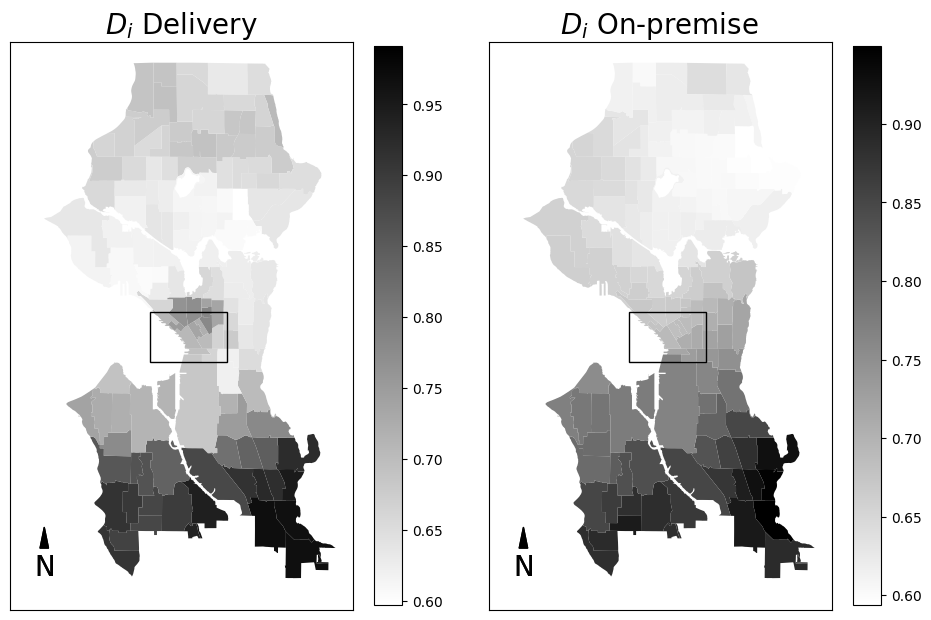

In [46]:
sub_titles = [     "$D_i$ Delivery",    "$D_i$ On-premise "]
columns_to_plot = [    "Diversity index with only Delivery",    "Diversity index without Delivery"]
count = 0
cmap = matplotlib.colormaps['binary']
fig, axs = plt.subplots(1, 2, figsize=(10,8))

for j in range(2):
    df_a.to_crs(epsg=4326).plot(column=columns_to_plot[count], ax=axs[j], cmap=cmap, legend=True, legend_kwds={'shrink': 0.78})

    axs[j].set_xticks([])
    axs[j].set_yticks([])
    axs[j].set_xlim(-122.459444, -122.224167) 
    axs[j].set_ylim(47.480833, 47.743889) 
    axs[j].set_title(sub_titles[count], fontsize=20)
    count += 1
    
    axs[j].annotate('N', xy=(0.1, 0.15), xytext=(0.1, 0.05), ha='center', va='bottom',
                    xycoords='axes fraction', textcoords='axes fraction', fontsize=20,
                    arrowprops=dict(facecolor='black', arrowstyle='wedge'))
    # Create a Rectangle patch
    rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='black', facecolor='none')

# Add the patch to the axes
    axs[j].add_patch(rect)
    # add north arrow
    axs[j].annotate('N', xy=(0.1, 0.15), xytext=(0.1, 0.05), ha='center', va='bottom',
                    xycoords='axes fraction', textcoords='axes fraction', fontsize=20,
                    arrowprops=dict(facecolor='black', arrowstyle='wedge'))

fig.subplots_adjust(wspace=0.1) # adjust the spacing between subplots
fig.tight_layout(pad=3.0)
plt.savefig(input_path + 'figures/D_i_comparison.png', bbox_inches='tight')
plt.show()

###  Does Online SNAP program accurately addressing food access deficiency.



- "LowIncomeTracts": Flag for low income tract
- "LATractsVehicle_20": Flag for tract where >= 100 of households do not have a vehicle, 
                      and beyond 1/2 mile from supermarket; 
                      or >= 500 individuals are beyond 20 miles from supermarket ; 
                      or >= 33% of individuals are beyond 20 miles from supermarket
                     

In [47]:
df_a['high_participation_rate'] = df_a.index.isin(high_participation_row).astype(int)

### Plot $A_{i,grocery}$ on-premise + delivery
only the first three subplots are used.

In [55]:
df_a['Food Accessibility Grocery'] = df_a['Food Accessibility with only Delivery grocery'] + df_a['Food Accessibility without Delivery grocery']

/var/folders/m4/2x0gw_kj5tv31gf3pgyw9jpm0000gn/T/ipykernel_45306/897539667.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('binary')


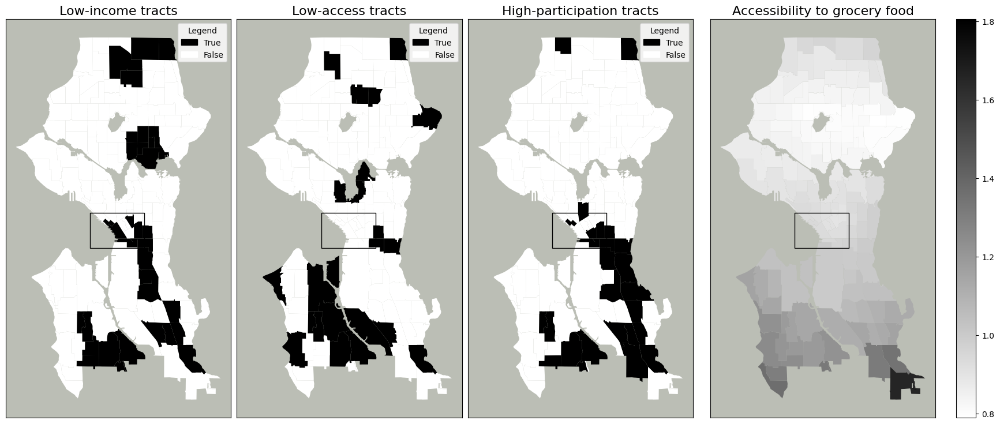

In [60]:
import matplotlib.patches as mpatches

sub_titles = ["Low-income tracts", "Low-access tracts", "High-participation tracts", "Accessibility to grocery food"]
columns_to_plot = ["LowIncomeTracts", "LATractsVehicle_20", "high_participation_rate", "Food Accessibility Grocery"]
x_min, x_max = -122.363604, -122.310561
y_min, y_max = 47.595458, 47.618721
rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='black', facecolor='none')


fig, axs = plt.subplots(1, 4, figsize=(20, 8))
plt.subplots_adjust(wspace=-0.6, hspace=0.3) # adjust the spacing
cmap = plt.cm.get_cmap('binary')
for i in range(3):
    # plot base map
    plot_helper = df_a.to_crs(epsg=4326).plot(column=columns_to_plot[i], ax=axs[i], cmap=cmap,
                                              legend=False)  # Remove the legend here

    # set background color to gray
    axs[i].set_facecolor('#BBBEB5')
    # remove the x and y ticks, set titles for subplots
    axs[i].set_xticks([], [])
    axs[i].set_yticks([], [])
    axs[i].set_title(sub_titles[i], fontsize=16)  # Adjust the fontsize here
# # Add the patch to the axes
    rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='black', facecolor='none')
    axs[i].add_patch(rect)
# Create custom legends for the first three subplots
legend_true = mpatches.Patch(color='black', label='True')
legend_false = mpatches.Patch(color='white', label='False')

axs[0].legend(handles=[legend_true, legend_false], loc='upper right', title='Legend')
axs[1].legend(handles=[legend_true, legend_false], loc='upper right', title='Legend')
axs[2].legend(handles=[legend_true, legend_false], loc='upper right', title='Legend')


# # Plot the last subplot with a color bar
plot_helper = df_a.to_crs(epsg=4326).plot(column=columns_to_plot[3], ax=axs[3], cmap=cmap,
                                          legend=True)  # Include the color bar

# set background color to gray
axs[3].set_facecolor('#BBBEB5')
# remove the x and y ticks, set title for the last subplot
axs[3].set_xticks([], [])
axs[3].set_yticks([], [])
axs[3].set_title(sub_titles[3], fontsize=16)  # Adjust the fontsize here
rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='black', facecolor='none')
axs[3].add_patch(rect)
fig.tight_layout(pad=3.0)
plt.savefig(input_path + 'figures/FARA_tracts_property_and_grocery.png', bbox_inches='tight')
# fig.suptitle("Census tract characteristics from Food Access Research Atlas 2019", fontsize=16)
plt.show()
